In [25]:
!pip install -r Requirements.txt


   ---------------------------------------- 0/4 [pytz]
   ---------------------------------------- 0/4 [pytz]
   ---------------------------------------- 0/4 [pytz]
   ---------------------------------------- 0/4 [pytz]
   ---------------------------------------- 0/4 [pytz]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   -------------------- ------------------- 2/4 [datetime]
   -------------------- ------------------- 2/4 [datetime]
   ------------------


[notice] A new release of pip is available: 25.2 -> 26.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import numpy as np
import matplotlib.pyplot as plt 
import sys, glob 
import soundfile as sf 
import sofa
import librosa 
from scipy import signal 
from IPython.display import Audio 
import xarray as xr

In [2]:
from netCDF4 import Dataset

with Dataset("dataset/IRC_1002_C_44100.sofa", "r") as f:
    # Check what attributes actually exist
    print("Global attributes:", f.ncattrs())
    print("Variables:", list(f.variables.keys()))

Global attributes: ['Data.SamplingRate.Units', 'NC_GLOBAL._NCProperties', 'NC_GLOBAL.Conventions', 'NC_GLOBAL.Version', 'NC_GLOBAL.SOFAConventions', 'NC_GLOBAL.SOFAConventionsVersion', 'NC_GLOBAL.DataType', 'NC_GLOBAL.RoomType', 'NC_GLOBAL.Title', 'NC_GLOBAL.DateCreated', 'NC_GLOBAL.DateModified', 'NC_GLOBAL.APIName', 'NC_GLOBAL.APIVersion', 'NC_GLOBAL.AuthorContact', 'NC_GLOBAL.Organization', 'NC_GLOBAL.License', 'NC_GLOBAL.ApplicationName', 'NC_GLOBAL.ApplicationVersion', 'NC_GLOBAL.Comment', 'NC_GLOBAL.History', 'NC_GLOBAL.References', 'NC_GLOBAL.Origin', 'NC_GLOBAL.RoomShortName', 'NC_GLOBAL.RoomDescription', 'NC_GLOBAL.RoomLocation', 'NC_GLOBAL.ListenerShortName', 'NC_GLOBAL.ListenerDescription', 'NC_GLOBAL.SourceShortName', 'NC_GLOBAL.SourceDescription', 'NC_GLOBAL.ReceiverShortName', 'NC_GLOBAL.ReceiverDescription', 'NC_GLOBAL.EmitterShortName', 'NC_GLOBAL.EmitterDescription', 'NC_GLOBAL.DatabaseName', 'NC_GLOBAL.URL', 'NC_GLOBAL.RoomVolume']
Variables: ['Data.SamplingRate', 'Li

Dataset : HRTF(positions=187, samples=512, sr=44100 Hz, source='IRC_1002_C_44100.sofa')


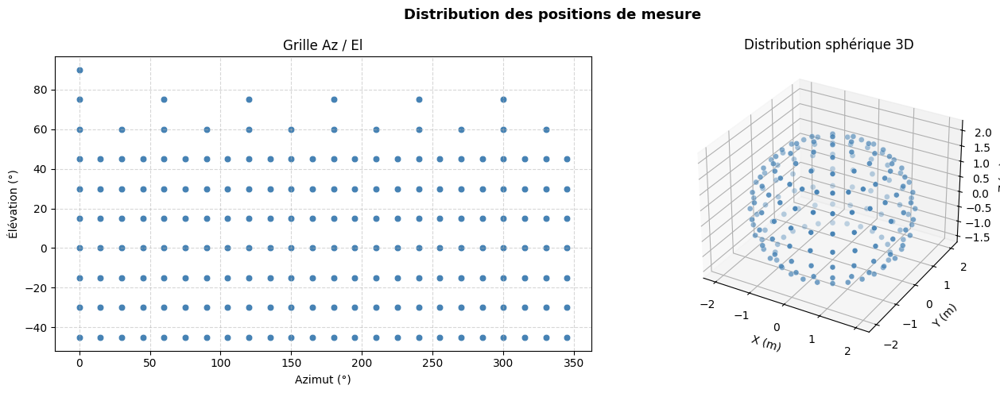

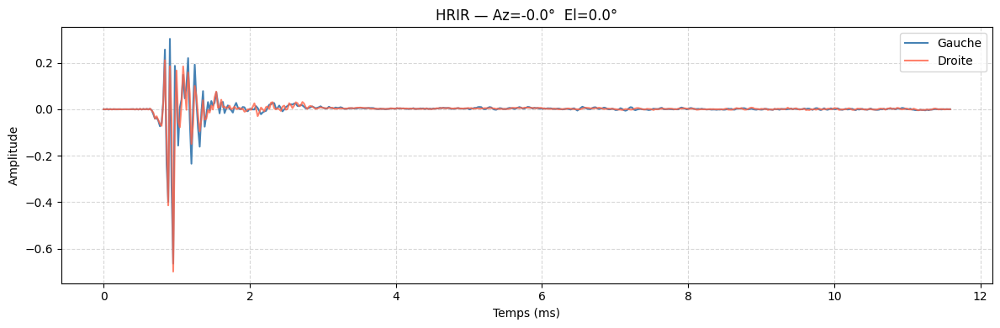

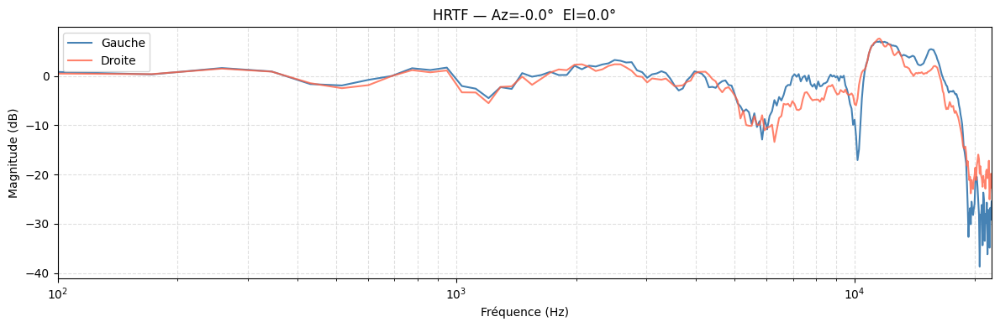

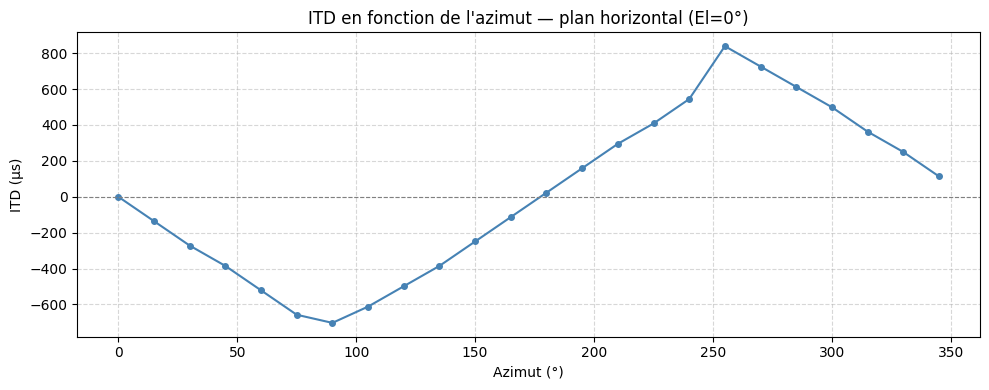

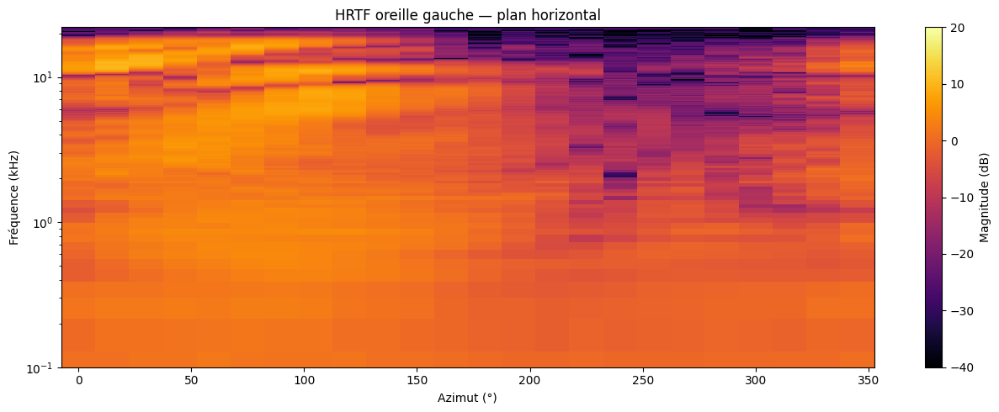

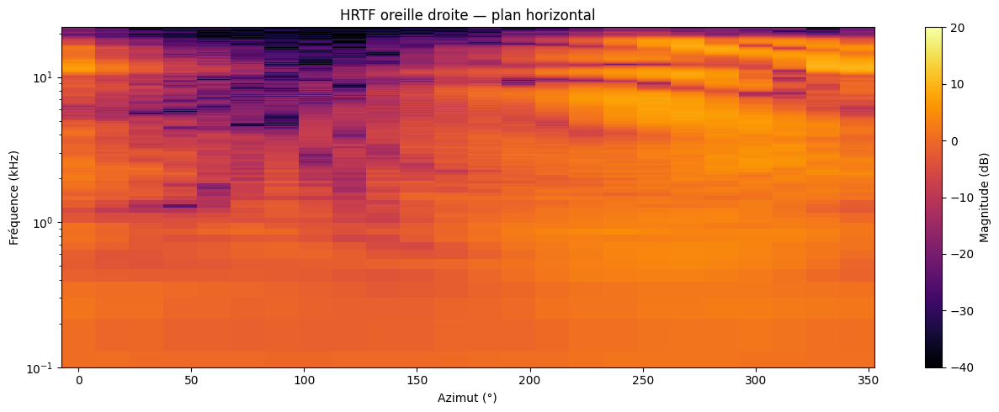

In [4]:
from hrtf import HRTF
from visualisation import HRTFVisualizer

hrtf = HRTF.from_sofa("dataset/IRC_1002_C_44100.sofa")
viz  = HRTFVisualizer(hrtf)
viz.plot_all()                          # tout d'un coup


In [5]:
# create a simple impulse signal
import soundfile as sf

duration = 10 # secondes
sr = 44100  # taux d'échantillonnage

impulse_every_secs = np.zeros(sr*duration)
impulse_every_secs_dephase = np.zeros(sr*duration)

offset = int(1*sr)  # 1 seconde d'offset avant la première impulsion

# Une impulsion toutes les 2 secondes
for i in range(duration // 2):
    impulse_every_secs[i * 2 * sr] = 1
    

# Une impulsion toutes les 2 secondes déphasée de 1s
for i in range(duration // 2):
    pos = i * 2 * sr + offset
    if pos < len(impulse_every_secs_dephase):
        impulse_every_secs_dephase[pos] = 0.5

sf.write("impulse_repeated.wav", impulse_every_secs.astype(np.float32), sr)
sf.write("impulse_repeated_dephase.wav", impulse_every_secs_dephase.astype(np.float32), sr)
 
# Charger l'impulsion
impulse, sr = sf.read("impulse_repeated.wav")

# Charger l'impulsion
impulse_dephase, sr = sf.read("impulse_repeated_dephase.wav")

# Ecouter l'impulsion
Audio(impulse, rate=sr , normalize = False)

In [6]:
#create a continus sinus signal 
duration = 10 # secondes
sr = 44100  # taux d'échantillonnage
facteur = 1/np.sqrt(100000) # pour éviter la saturation -3db

sinus_LA = np.zeros(sr*duration)
frequency = 440  # Fréquence du LA4

t = np.linspace(0, duration, sr*duration, endpoint=False)
sinus_LA = facteur * np.sin(2 * np.pi * frequency * t)  
sf.write("sinus_LA.wav", sinus_LA.astype(np.float32), sr)

audio_sinus_LA, sr = sf.read("sinus_LA.wav")
Audio(audio_sinus_LA, rate=sr, normalize = False)

In [7]:
# Ecouter l'impulsion
Audio(impulse_dephase, rate=sr, normalize = False)

In [40]:
from hrtf import HRTF
from Convolution import HRTFConvolver
from Soundsource import SoundSource
from IPython.display import Audio

# 1. Charger le dataset
hrtf = HRTF.from_sofa("dataset/IRC_1002_C_44100.sofa")

# 2. Définir la source positionnée
source = SoundSource(path="impulse_repeated.wav", azimuth=-90, elevation=90, distance=2.06)

# 3. Créer le convolveur depuis la source (charge le signal automatiquement)
convolver = HRTFConvolver.from_source(hrtf, source)

# 4. Lancer la convolution
convolver.run()

# 5. Sauvegarder
convolver.save(path_left="Left.wav", path_right="Right.wav", path_merged="Merged_audio.wav")


[HRTFConvolver] Position sélectionnée : Az=270.0°  El=59.99999999999999°  (indice 177)
[HRTFConvolver] Signal chargé : 441000 échantillons (10.00s) @ 44100 Hz
[HRTFConvolver] Convolution canal gauche...
[HRTFConvolver] Convolution canal droit...
[HRTFConvolver] Sortie : 441511 échantillons (10.01s)
[HRTFConvolver] Gain appliqué : 1.0000 (distance=2.06m, gain=1.0)
[HRTFConvolver] merged_audio prêt : shape=(441511, 2)
[HRTFConvolver] Sauvegardé : Left.wav
[HRTFConvolver] Sauvegardé : Right.wav
[HRTFConvolver] Sauvegardé : Merged_audio.wav


In [41]:
#Ecouter 
Audio("Left.wav")

In [42]:
Audio("Merged_audio.wav")

In [9]:
import numpy as np
import soundfile as sf
from IPython.display import Audio
from hrtf import HRTF
from Soundsource import SoundSource
from Soundscape import Soundscape

# ── 2. Construire le paysage sonore ───────────────────────────────────
hrtf = HRTF.from_sofa("dataset/IRC_1002_C_44100.sofa")

scene = Soundscape(hrtf)

# Impulsion normale  — gauche, plan horizontal
scene.add_source(SoundSource(path="impulse_repeated.wav",         azimuth=90,  elevation=0,   distance=2.06))

# Impulsion déphasée — droite, légèrement surélevée
scene.add_source(SoundSource(path="impulse_repeated_dephase.wav", azimuth=-90, elevation=15,  distance=2.06))

# ── 3. Rendre et sauvegarder ────────────────────────────────────────── 
stereo = scene.render()
scene.save("soundscape_2sources.wav")

# ── 4. Écouter ────────────────────────────────────────────────────────
Audio("soundscape_2sources.wav" , normalize=False)


[Soundscape] Source ajoutée : SoundSource(path='impulse_repeated.wav', az=90°, el=0°, dist=2.06m, gain=1.0)
[Soundscape] Source ajoutée : SoundSource(path='impulse_repeated_dephase.wav', az=-90°, el=15°, dist=2.06m, gain=1.0)

[Soundscape] Traitement source 1/2 — SoundSource(path='impulse_repeated.wav', az=90°, el=0°, dist=2.06m, gain=1.0)
[HRTFConvolver] Position sélectionnée : Az=90.0°  El=0.0°  (indice 78)
[HRTFConvolver] Signal chargé : 441000 échantillons (10.00s) @ 44100 Hz
[HRTFConvolver] Convolution canal gauche...
[HRTFConvolver] Convolution canal droit...
[HRTFConvolver] Sortie : 441511 échantillons (10.01s)
[HRTFConvolver] Gain appliqué : 1.0000 (distance=2.06m, gain=1.0)
[HRTFConvolver] merged_audio prêt : shape=(441511, 2)

[Soundscape] Traitement source 2/2 — SoundSource(path='impulse_repeated_dephase.wav', az=-90°, el=15°, dist=2.06m, gain=1.0)
[HRTFConvolver] Position sélectionnée : Az=270.0°  El=14.999999999999998°  (indice 114)
[HRTFConvolver] Signal chargé : 441000 é

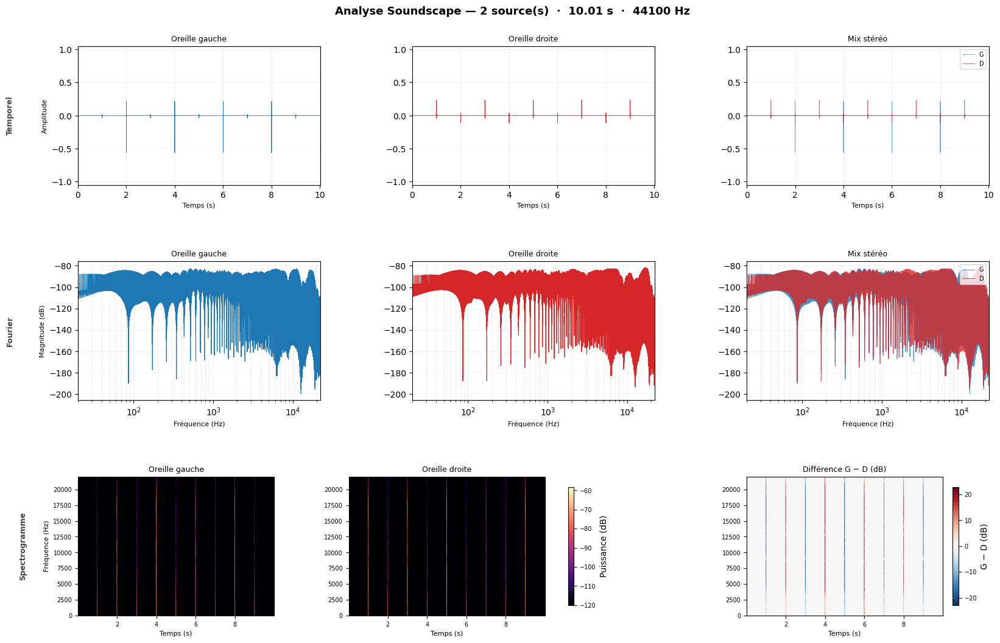

In [10]:
from SoundVisu import SoundVisu

visu = SoundVisu(scene)
visu.plot_all()

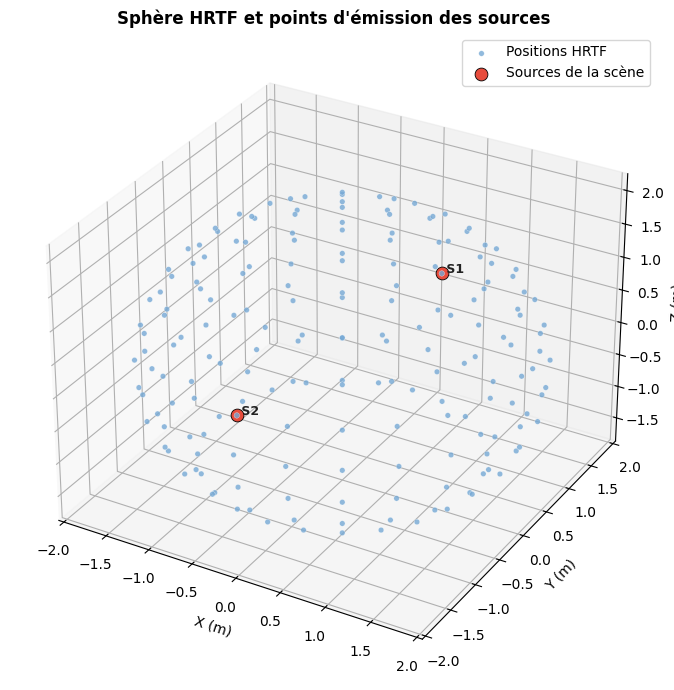

In [11]:
import importlib
import SoundVisu as sv_mod

importlib.reload(sv_mod)

visu = sv_mod.SoundVisu(scene)
visu.plot_scene_sphere()